In [1]:
from edgeml import edgeml

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
from sklearn.model_selection import LeaveOneGroupOut

from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
#from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix

In [2]:
# get the API key from the settings of your project
project = edgeml.getProject("https://app.edge-ml.org", "zfOAqoW+L7b/NzeoMPtdqqn8jVkk5G9Iy8dzT27eCEnm+GiYlHwd1BMz6mcLJPZfupbs0n75xttwqwsCOceJig==")
project

fetching project...


{'datasets': [{'sensors': [{'name': 'alpha',
     'data': [{'timestamp': 1658487383242, 'datapoint': 358.87},
      {'timestamp': 1658487383259, 'datapoint': 359.46},
      {'timestamp': 1658487383276, 'datapoint': 0.19},
      {'timestamp': 1658487383293, 'datapoint': 358.59},
      {'timestamp': 1658487383310, 'datapoint': 359.64},
      {'timestamp': 1658487383327, 'datapoint': 0.38},
      {'timestamp': 1658487383343, 'datapoint': 0.74},
      {'timestamp': 1658487383359, 'datapoint': 0.63},
      {'timestamp': 1658487383376, 'datapoint': 0.2},
      {'timestamp': 1658487383393, 'datapoint': 359.22},
      {'timestamp': 1658487383410, 'datapoint': 358.39},
      {'timestamp': 1658487383426, 'datapoint': 357.51},
      {'timestamp': 1658487383443, 'datapoint': 356.58},
      {'timestamp': 1658487383460, 'datapoint': 356.41},
      {'timestamp': 1658487383476, 'datapoint': 356.33},
      {'timestamp': 1658487383493, 'datapoint': 356.15},
      {'timestamp': 1658487383509, 'datapoint'

In [3]:
project_datasets = project["datasets"]
#print(project_datasets)

data = {}

for dataset in project_datasets:
    if not dataset["labels"] or not dataset["labels"][0]:
        continue;
    for sensor in dataset["sensors"]:
        for datapoint in sensor["data"]:
            timestamp = datetime.datetime.utcfromtimestamp(datapoint["timestamp"]/1000)
            if timestamp not in data:
                data[timestamp] = {"label":dataset["labels"][0][0]["name"]}
            data[timestamp][sensor["name"]] = datapoint["datapoint"]


In [4]:
df = pd.DataFrame.from_dict(data,"index").sort_index()
df

,label,alpha,beta,gamma,x0,y0,z0,x,y,z
2022-07-22 11:01:42.805,car,0.67,22.91,-3.54,NaN,NaN,NaN,NaN,NaN,NaN
2022-07-22 11:01:42.822,car,0.63,22.92,-3.52,NaN,NaN,NaN,NaN,NaN,NaN
2022-07-22 11:01:42.838,car,0.59,22.93,-3.54,NaN,NaN,NaN,NaN,NaN,NaN
2022-07-22 11:01:42.855,car,-0.24,-2.00,-2.23,-0.05,-0.05,0.42,-0.60,-3.87,-8.59
2022-07-22 11:01:42.872,car,0.47,-1.79,-2.18,-0.09,-0.05,-0.15,-0.65,-3.88,-9.16
...,...,...,...,...,...,...,...,...,...,...
2022-07-23 15:03:24.747,table,0.01,-0.04,-0.07,0.01,0.00,0.04,0.02,-0.11,-9.77
2022-07-23 15:03:24.764,table,-0.04,-0.06,-0.08,0.01,0.00,0.03,0.01,-0.12,-9.77
2022-07-23 15:03:24.780,table,0.10,-0.02,-0.01,0.01,0.00,0.05,0.01,-0.11,-9.76
2022-07-23 15:03:24.797,table,0.09,-0.12,0.02,-0.01,0.00,0.05,-0.01,-0.12,-9.76


In [5]:
df_features = pd.DataFrame(df['label'])
df_features['mean_alpha'] = df['alpha'].rolling('500ms').mean()
df_features['mean_beta'] = df['beta'].rolling('500ms').mean()
df_features['mean_gamma'] = df['gamma'].rolling('500ms').mean()
df_features['mean_x'] = df['x'].rolling('500ms').mean()
df_features['mean_y'] = df['y'].rolling('500ms').mean()
df_features['mean_z'] = df['z'].rolling('500ms').mean()
df_features['mean_x0'] = df['x0'].rolling('500ms').mean()
df_features['mean_y0'] = df['y0'].rolling('500ms').mean()
df_features['mean_z0'] = df['z0'].rolling('500ms').mean()

df_features['var_alpha'] = df['alpha'].rolling('500ms').var()
df_features['var_beta'] = df['beta'].rolling('500ms').var()
df_features['var_gamma'] = df['gamma'].rolling('500ms').var()
df_features['var_x'] = df['x'].rolling('500ms').var()
df_features['var_y'] = df['y'].rolling('500ms').var()
df_features['var_z'] = df['z'].rolling('500ms').var()
df_features['var_x0'] = df['x0'].rolling('500ms').var()
df_features['var_y0'] = df['y0'].rolling('500ms').var()
df_features['var_z0'] = df['z0'].rolling('500ms').var()

df_features['median_alpha'] = df['alpha'].rolling('500ms').median()
df_features['median_beta'] = df['beta'].rolling('500ms').median()
df_features['median_gamma'] = df['gamma'].rolling('500ms').median()
df_features['median_x'] = df['x'].rolling('500ms').median()
df_features['median_y'] = df['y'].rolling('500ms').median()
df_features['median_z'] = df['z'].rolling('500ms').median()
df_features['median_x0'] = df['x0'].rolling('500ms').median()
df_features['median_y0'] = df['y0'].rolling('500ms').median()
df_features['median_z0'] = df['z0'].rolling('500ms').median()



df_features = df_features.dropna()
df_features

,label,mean_alpha,mean_beta,mean_gamma,mean_x,mean_y,mean_z,mean_x0,mean_y0,mean_z0,...,var_z0,median_alpha,median_beta,median_gamma,median_x,median_y,median_z,median_x0,median_y0,median_z0
2022-07-22 11:01:42.872,car,0.424000,12.994000,-3.002000e+00,-6.250000e-01,-3.875000,-8.875000,-0.070000,-0.050000,0.135000,...,0.162450,0.590,22.910,-3.520,-0.625,-3.875,-8.875,-0.070,-0.05,0.135
2022-07-22 11:01:42.888,car,0.405000,10.635000,-2.916667e+00,-6.300000e-01,-3.860000,-9.046667,-0.073333,-0.033333,-0.033333,...,0.166233,0.530,10.875,-3.005,-0.640,-3.870,-9.160,-0.080,-0.05,-0.150
2022-07-22 11:01:42.905,car,0.505714,8.874286,-2.818571e+00,-6.475000e-01,-3.880000,-9.087500,-0.090000,-0.052500,-0.072500,...,0.116958,0.590,-1.160,-2.490,-0.645,-3.875,-9.185,-0.085,-0.05,-0.170
2022-07-22 11:01:42.921,car,0.537500,7.618750,-2.657500e+00,-6.540000e-01,-3.882000,-9.050000,-0.096000,-0.054000,-0.036000,...,0.094380,0.610,-1.165,-2.360,-0.650,-3.880,-9.160,-0.090,-0.05,-0.150
2022-07-22 11:01:42.938,car,0.570000,6.644444,-2.640000e+00,-6.200000e-01,-3.873333,-9.058333,-0.061667,-0.045000,-0.045000,...,0.075990,0.630,-1.160,-2.490,-0.645,-3.875,-9.130,-0.085,-0.05,-0.120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-23 15:03:24.747,table,0.009667,-0.009333,-3.238150e-18,-1.000000e-03,-0.110333,-9.759667,-0.003333,0.004000,0.046000,...,0.000142,0.005,-0.005,0.000,0.000,-0.110,-9.760,0.000,0.00,0.040
2022-07-23 15:03:24.764,table,0.003667,-0.012333,-4.666667e-03,-3.333333e-04,-0.111000,-9.760333,-0.002667,0.003667,0.045000,...,0.000143,-0.005,-0.010,-0.015,0.000,-0.110,-9.760,0.000,0.00,0.040
2022-07-23 15:03:24.780,table,0.012000,-0.017667,-2.333333e-03,3.333333e-04,-0.111333,-9.760333,-0.002000,0.003333,0.045333,...,0.000143,0.005,-0.015,-0.005,0.000,-0.110,-9.760,0.000,0.00,0.040
2022-07-23 15:03:24.797,table,0.012000,-0.021667,2.333333e-03,2.255141e-18,-0.112000,-9.761000,-0.002333,0.002667,0.045000,...,0.000136,0.005,-0.020,0.000,0.000,-0.115,-9.760,0.000,0.00,0.040


In [35]:
features = df_features.keys().to_numpy()
features = features[1:,]

'median_z0'

In [6]:
var_xyz_df = df_features[["label","var_x","var_y","var_z"]].copy()
mean_xyz_df = df_features[["label","mean_x","mean_y","mean_z"]].copy()
median_xyz_df = df_features[["label","median_x","median_y","median_z"]].copy()
var_abg_df = df_features[["label","var_alpha","var_beta","var_gamma"]].copy()
mean_abg_df = df_features[["label","mean_alpha","mean_beta","mean_gamma"]].copy()
var_xyz_df

,label,var_x,var_y,var_z
2022-07-22 11:01:42.872,car,0.001250,0.000050,0.162450
2022-07-22 11:01:42.888,car,0.000700,0.000700,0.169633
2022-07-22 11:01:42.905,car,0.001692,0.002067,0.119758
2022-07-22 11:01:42.921,car,0.001480,0.001570,0.096850
2022-07-22 11:01:42.938,car,0.008120,0.001707,0.077897
...,...,...,...,...
2022-07-23 15:03:24.747,table,0.000189,0.000114,0.000155
2022-07-23 15:03:24.764,table,0.000190,0.000113,0.000155
2022-07-23 15:03:24.780,table,0.000190,0.000109,0.000155
2022-07-23 15:03:24.797,table,0.000193,0.000106,0.000140


<AxesSubplot:xlabel='label', ylabel='Count'>

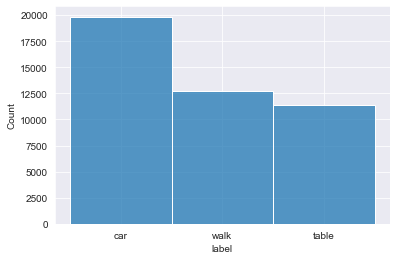

In [7]:
sns.histplot(var_xyz_df,x="label")

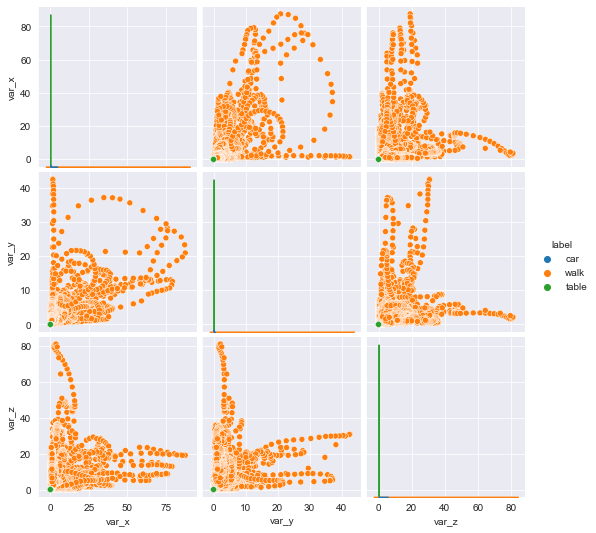

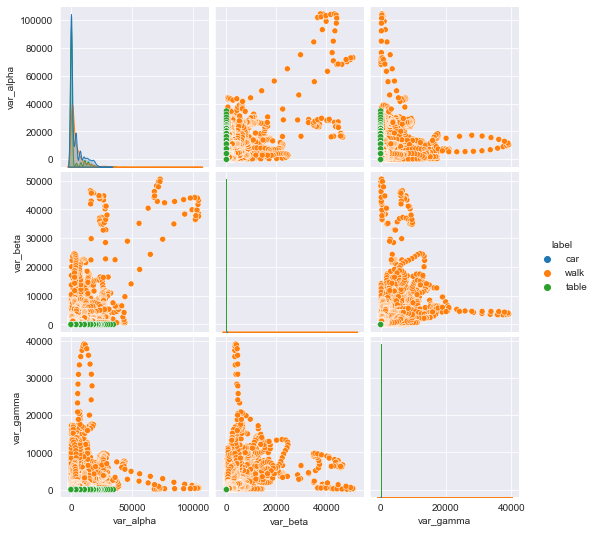

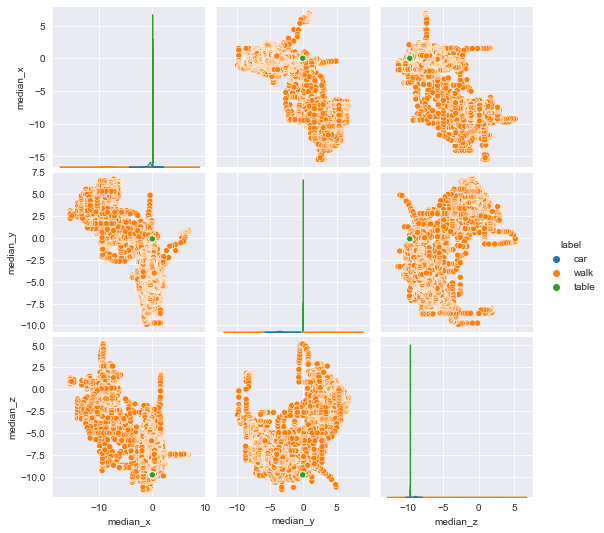

In [8]:
sns.pairplot(var_xyz_df,hue="label")
sns.pairplot(var_abg_df,hue="label")
sns.pairplot(median_xyz_df,hue="label")


/var/folders/b9/92ltt7291ll0jhgy8smzrjyr0000gn/T/ipykernel_1376/417995740.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_no_walk = var_xyz_df[df["label"] != "walk"]


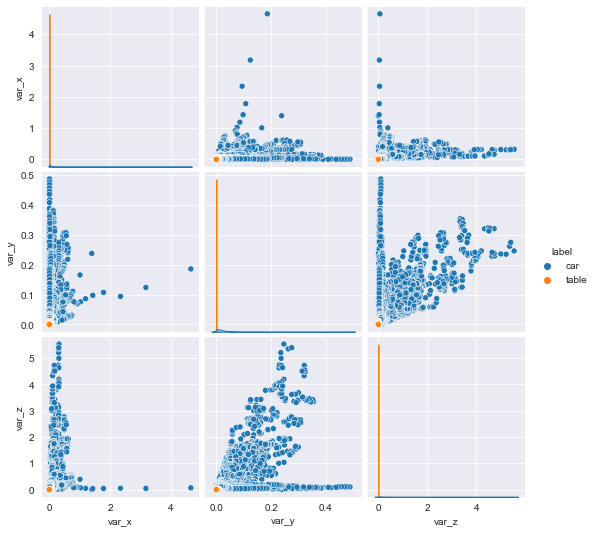

In [9]:
df_no_walk = var_xyz_df[df["label"] != "walk"]
sns.pairplot(df_no_walk, hue="label")

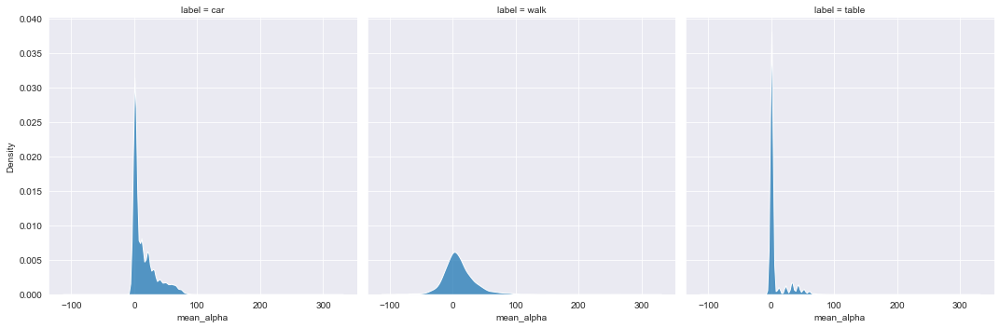

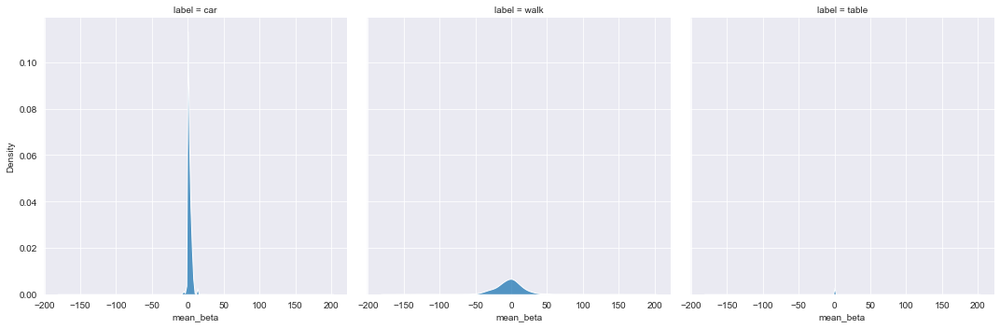

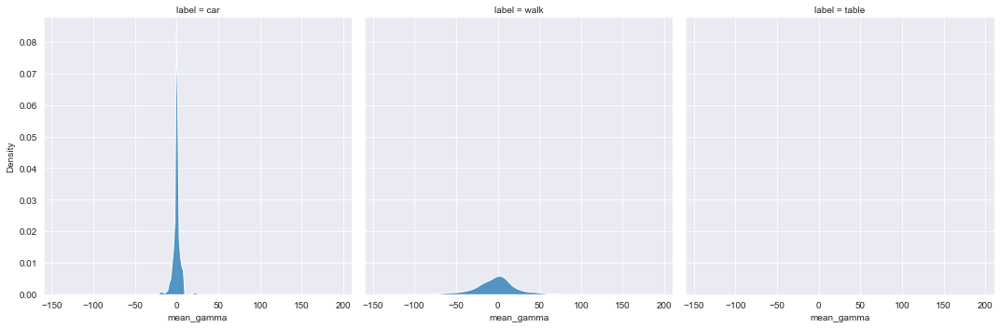

In [10]:
sns.displot(data=mean_abg_df, x="mean_alpha", col="label", multiple="stack", kind="kde")
sns.displot(data=mean_abg_df, x="mean_beta", col="label", multiple="stack", kind="kde")
sns.displot(data=mean_abg_df, x="mean_gamma", col="label", multiple="stack", kind="kde")

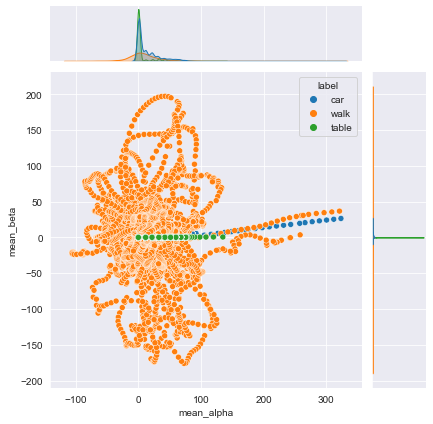

In [11]:
sns.jointplot(data=mean_abg_df, x="mean_alpha", y="mean_beta", hue="label")

In [26]:
# Split into labels and data
data_classes = df_features['label'].unique()
print(data_classes)

X = np.array(df_features.drop(['label'],1))
#y = np.array(df_features['label'])
print(X)

#Convert label strings to numeric values
d = dict(zip(data_classes, range(0,len(data_classes))))
print(d)

y = np.array(df_features['label'].map(d, na_action='ignore'))
print(y)
print(X.shape)
print(y.shape)

['car' 'walk' 'table']
[[ 4.24000000e-01  1.29940000e+01 -3.00200000e+00 ... -7.00000000e-02
  -5.00000000e-02  1.35000000e-01]
 [ 4.05000000e-01  1.06350000e+01 -2.91666667e+00 ... -8.00000000e-02
  -5.00000000e-02 -1.50000000e-01]
 [ 5.05714286e-01  8.87428571e+00 -2.81857143e+00 ... -8.50000000e-02
  -5.00000000e-02 -1.70000000e-01]
 ...
 [ 1.20000000e-02 -1.76666667e-02 -2.33333333e-03 ...  0.00000000e+00
   0.00000000e+00  4.00000000e-02]
 [ 1.20000000e-02 -2.16666667e-02  2.33333333e-03 ...  0.00000000e+00
   0.00000000e+00  4.00000000e-02]
 [ 7.33333333e-03 -1.60000000e-02  4.66666667e-03 ...  0.00000000e+00
   0.00000000e+00  4.50000000e-02]]
{'car': 0, 'walk': 1, 'table': 2}
[0 0 0 ... 2 2 2]
(43905, 27)
(43905,)


/var/folders/b9/92ltt7291ll0jhgy8smzrjyr0000gn/T/ipykernel_1376/2799607549.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  X = np.array(df_features.drop(['label'],1))


In [13]:
#'Session'+(df_features.index.to_series().diff().fillna(0)/np.timedelta64(800, 'ms')).gt(1).cumsum().add(1).astype(str)
'Group'+ (df_features.index.to_series().diff().fillna(np.timedelta64(0,'ms'))/np.timedelta64(800, 'ms')).gt(1).cumsum().add(1).astype(str)
groups = np.array((df_features.index.to_series().diff().fillna(np.timedelta64(0,'ms'))/np.timedelta64(1000, 'ms')).gt(1).cumsum().add(1))
groups

array([ 1,  1,  1, ..., 12, 12, 12])

In [16]:
names = [
    "Nearest Neighbors",
    #"Linear SVM",
    #"RBF SVM",
    #"Gaussian Process",
    "Decision Tree",
    "Random Forest",
    "Neural Net",
    #"AdaBoost",
    #"Naive Bayes",
    #"QDA",
]

classifiers = [
    KNeighborsClassifier(5),
    #SVC(kernel="linear", C=0.025),
    #SVC(gamma=2, C=1),
    #GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    #AdaBoostClassifier(),
    #GaussianNB(),
    #QuadraticDiscriminantAnalysis(),
]

In [17]:
accuracies = {}
precisions = {}
recalls = {}
f1_scores = {}

for name in names:
    accuracies[name] = []
    precisions[name] = []
    recalls[name] = []
    f1_scores[name] = []

# Perform Leave-One-Subject_Out
logo = LeaveOneGroupOut()
logo.get_n_splits(X, y, groups)

for train_index, test_index in logo.split(X, y, groups):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # iterate over classifiers
    for name, clf in zip(names, classifiers):
        #ax = plt.subplot(1, len(classifiers) + 1, i)
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)
        y_pred = clf.predict(X_test)

        accuracies[name].append(accuracy_score(y_test, y_pred))
        precisions[name].append(precision_score(y_test, y_pred, average="macro"))
        recalls[name].append(recall_score(y_test, y_pred, average="macro"))
        f1_scores[name].append(f1_score(y_test, y_pred, average="macro"))


values = pd.DataFrame([accuracies,precisions,recalls,f1_scores],index = ["acc", "prec", "rec", "f1"])
values = values.applymap(np.mean)
values

/Users/marvinwoller/Desktop/KonSys/KonSys_ML_Project/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/marvinwoller/Desktop/KonSys/KonSys_ML_Project/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/marvinwoller/Desktop/KonSys/KonSys_ML_Project/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, le

,Nearest Neighbors,Decision Tree,Random Forest,Neural Net
acc,0.933669,0.977071,0.982195,0.957103
prec,0.430556,0.777778,0.666667,0.777778
rec,0.399186,0.766415,0.657764,0.756679
f1,0.412062,0.771634,0.662104,0.764316


In [18]:
#Importing required libraries
from sklearn.model_selection import KFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score


accuraciesCV = {}
precisionsCV = {}
recallsCV = {}
f1_scoresCV = {}

for name in names:
    accuraciesCV[name] = []
    precisionsCV[name] = []
    recallsCV[name] = []
    f1_scoresCV[name] = []

#Implementing cross validation
k = 10
kf = KFold(n_splits=k, random_state=None)

for train_index , test_index in kf.split(X):
    X_train , X_test = X[train_index,:],X[test_index,:]
    y_train , y_test = y[train_index] , y[test_index]

    for name, clf in zip(names, classifiers):
        clf.fit(X_train, y_train)
        #score = clf.score(X_test, y_test)
        y_pred = clf.predict(X_test)

        accuraciesCV[name].append(accuracy_score(y_test, y_pred))
        precisionsCV[name].append(precision_score(y_test, y_pred, average="macro"))
        recallsCV[name].append(recall_score(y_test, y_pred, average="macro"))
        f1_scoresCV[name].append(f1_score(y_test, y_pred, average="macro"))

valuesCV = pd.DataFrame([accuraciesCV,precisionsCV,recallsCV,f1_scoresCV],index = ["acc", "prec", "rec", "f1"])
valuesCV = valuesCV.applymap(np.mean)
valuesCV

/Users/marvinwoller/Desktop/KonSys/KonSys_ML_Project/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/marvinwoller/Desktop/KonSys/KonSys_ML_Project/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/marvinwoller/Desktop/KonSys/KonSys_ML_Project/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, le

,Nearest Neighbors,Decision Tree,Random Forest,Neural Net
acc,0.922948,0.985947,0.994306,0.924359
prec,0.549936,0.816667,0.716493,0.600000
rec,0.514819,0.807897,0.713197,0.561861
f1,0.529751,0.812038,0.714821,0.576949


In [37]:
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline

# define dataset
#X, y = make_classification(n_samples=1000, n_features=10, n_informative=5, n_redundant=5, random_state=1)
# create pipeline
print(X.shape)
print(y.shape)

#for train_index, test_index in logo.split(X, y, groups):
   # X_train, X_test = X[train_index], X[test_index]
    #y_train, y_test = y[train_index], y[test_index]
    #print(X_train.shape)
    #print(y_train.shape)
    #print(X_test.shape)
    #print(y_test.shape)


rfe = RFE(estimator=DecisionTreeClassifier(), n_features_to_select=5)
model = DecisionTreeClassifier()
pipeline = Pipeline(steps=[('s',rfe),('m',model)])
# evaluate model with 10-fold CV
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=1, random_state=1)
n_scores = cross_val_score(pipeline, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
# report performance
print('Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

# fit RFE
rfe.fit(X, y)
# summarize all features
for i in range(X.shape[1]):
	print('Column: %d (%s), Selected %s, Rank: %.0f' % (i, features[i], rfe.support_[i], rfe.ranking_[i]))

(43905, 27)
(43905,)
Accuracy: 1.000 (0.000)
Column: 0 (mean_alpha), Selected False, Rank: 23
Column: 1 (mean_beta), Selected False, Rank: 22
Column: 2 (mean_gamma), Selected False, Rank: 21
Column: 3 (mean_x), Selected False, Rank: 19
Column: 4 (mean_y), Selected False, Rank: 17
Column: 5 (mean_z), Selected False, Rank: 16
Column: 6 (mean_x0), Selected False, Rank: 15
Column: 7 (mean_y0), Selected False, Rank: 14
Column: 8 (mean_z0), Selected False, Rank: 13
Column: 9 (var_alpha), Selected False, Rank: 12
Column: 10 (var_beta), Selected True, Rank: 1
Column: 11 (var_gamma), Selected True, Rank: 1
Column: 12 (var_x), Selected False, Rank: 11
Column: 13 (var_y), Selected False, Rank: 9
Column: 14 (var_z), Selected False, Rank: 20
Column: 15 (var_x0), Selected False, Rank: 18
Column: 16 (var_y0), Selected False, Rank: 8
Column: 17 (var_z0), Selected False, Rank: 10
Column: 18 (median_alpha), Selected False, Rank: 7
Column: 19 (median_beta), Selected False, Rank: 6
Column: 20 (median_gamm

In [19]:
# Gaussian Process

KeyboardInterrupt: 

In [ ]:
#X, y = sklearn.datasets.load_digits(return_X_y=True)
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(X, y, random_state=1)
automl = autosklearn.classification.AutoSklearnClassifier()
automl.fit(X_train, y_train)
y_hat = automl.predict(X_test)
print("Accuracy score", sklearn.metrics.accuracy_score(y_test, y_hat))

In [ ]:
import time
from edgeml.predictor import Predictor, PredictorError

from EdgeMLRndForrest_python import score

p = Predictor(
    lambda input: score(input),
    ['alpha', 'beta', 'gamma', 'x0', 'y0', 'z0', 'x', 'y', 'z'],
    100,
    ['62d96e3bc11866001371c055', '62d96e3bc11866001371c056', '62d96e3bc11866001371c057']
)

while True:
    p.add_datapoint('alpha', getalpha())
    p.add_datapoint('beta', getbeta())
    p.add_datapoint('gamma', getgamma())
    p.add_datapoint('x0', getx0())
    p.add_datapoint('y0', gety0())
    p.add_datapoint('z0', getz0())
    p.add_datapoint('x', getx())
    p.add_datapoint('y', gety())
    p.add_datapoint('z', getz())

    try:
        print(p.predict())
    except PredictorError:
        pass

    time.sleep(0.25)